# Social Network based on friendship relation via VK API

I decided to create an ego network which has the following properties: nodes are friends except me, edges are friendship. \\

Firstly, lets load the data from VK.

### VK Requests Instalation and Data Collection

In [ ]:
!pip install vk_requests

In [ ]:
import vk_requests 
import time          
import pandas as pd   
import itertools
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.cm import ScalarMappable
import plotly.express as px
import scipy.integrate as integrate
import scipy.special as special
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import sklearn 
from numpy import inf
from sklearn.cluster import KMeans
from sklearn.manifold import spectral_embedding
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from sklearn.cluster import AgglomerativeClustering
import networkx.algorithms.community as nx_comm
from collections import Counter
from IPython.display import clear_output

In [ ]:
# API authorization
token = 'PLACE FOR YOUR TOKEN'
api = vk_requests.create_api(service_token=token)

In [ ]:
response1 = api.friends.get(user_id= #PLACE FOR YOUR ID, 
                           fields=['sex', 'bdate', 'city', 'education', 'photo']) # let download the friends data
df = pd.json_normalize(response1['items'])

In [ ]:
len(response1['items']) # there are 431 friends

431

In [ ]:
#let`s have a look on data
df.head(5)

,id,first_name,last_name,can_access_closed,is_closed,sex,bdate,photo,track_code,city.id,city.title,university,university_name,faculty,faculty_name,graduation,deactivated,education_form,education_status
0,10088177,Даниил,Барсуков,True,False,2,28.3,https://sun9-29.userapi.com/s/v1/if1/3hP35mdhb...,36edbe42ScgIfkMc03B6ywySM3k3e9aQNjQZqOo8BmZBY1...,1.0,Москва,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,12150474,Маша,Коренко,True,False,1,7.7,https://sun9-23.userapi.com/s/v1/if1/Q9loHpOC7...,59f4d0d8AjMak3C2VRggs6eiy3BxgZXajyROGIWyXWBB-d...,1.0,Москва,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,15526722,Глеб,Ботезат,True,False,2,3.10.1997,https://sun9-60.userapi.com/s/v1/if1/6mfSG_QGF...,161192c5Q8C9KSDMZqxJt0AkI1Eo_-8smodeIL390Z3mIs...,1710959.0,Кишинев,0.0,,0.0,,0.0,NaN,NaN,NaN
3,17277208,DELETED,,NaN,NaN,1,NaN,https://vk.com/images/deactivated_50.png,ac5aced1Sh4U4pEcMf1-fRGg6wHVOg5tmySPGL70VGo2pI...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,deleted,NaN,NaN
4,19243810,Игнат,Усок,True,False,2,6.12,https://sun9-36.userapi.com/s/v1/if1/jxx3j-tqD...,9edb46dfK7bB-Q7CuvifQ8f_D2WO0075w2NWVpTDBEYkfw...,1.0,Москва,128.0,НИУ ВШЭ (ГУ-ВШЭ),0.0,,0.0,NaN,NaN,NaN


In [ ]:
# let drop deleted and blocked users

In [ ]:
df[df['first_name'] == 'DELETED'].shape

(15, 19)

In [ ]:
df = df.set_index ('first_name')
df = df.drop('DELETED', axis=0)
df = df.reset_index()
data = df[df['can_access_closed'] == True] # cleaned data

In [ ]:
def dict_of_friends(df):
  list_of_friends = {}
  for id in list(df['id']):
    time.sleep(1)
    response = api.friends.get(user_id=id)                        
    list_of_friends[id] = response['items']
  return list_of_friends

In [ ]:
list_of_friends = dict_of_friends(data)

In [ ]:
len(list_of_friends.keys())

402

In [ ]:
def removing_me(lst_of_friends):
  for id in lst_of_friends.keys():
    try:
      lst_of_friends[id].remove(#YOUR ID)
    except ValueError:
      continue
  return lst_of_friends

Lets check the correct work of code

In [ ]:
list_of_friends = removing_me(list_of_friends)
assert #YOUR ID not in list_of_friends[10088177] # first friend
assert #YOUR ID not in list_of_friends[628239277] # the last friend
assert #YOUR ID not in list_of_friends[251472549] # the 313^th friend

To get mutual friends let us consider all combinations of friends in size of two. To get the list of combonations I will use the iterltools module

In [ ]:
comb_of_friends = list(itertools.combinations(list_of_friends.keys(),2))

In [ ]:
len(comb_of_friends)

80601

Now let form the list of mutual friends. If user A is in a list of friends of user B, then we are friends. Consequently this will be an edge in graph.

In [ ]:
def mutual_friends(combinations, lst_of_friends):

  return [(user1, user2) for user1, user2 in combinations if user1 in lst_of_friends[user2]]

In [ ]:
list_of_edges = mutual_friends(comb_of_friends, list_of_friends)

In [ ]:
len(list_of_edges)

5266

In [ ]:
def generating_graph(edges):

  G = nx.Graph()
  G.add_edges_from(edges)
  attributes =  {}
  for i in range(len(response1['items'])):
    for node in G.nodes:
      if node ==   response1['items'][i]['id']:
          attributes[node] = response1['items'][i]
  nx.set_node_attributes(G,attributes)

  return G

In [ ]:
G = generating_graph(list_of_edges)

In [ ]:
G.nodes[87454319].update({'last_name' : 'Кучер Артем'})  # to differ the persons with the same last names

In [ ]:
G.nodes[143889200].update({'last_name' : 'Кучинская Ирина'}) # to differ the persons with the same last names

Let us have a look on graph we gained.

In [ ]:
def drawing_nodes_params(graph):

    params = {}
    params['G'] = graph
    params['pos'] = nx.kamada_kawai_layout(graph)
    params['node_color'] = []
    params['node_size'] = []
    for node in graph.nodes:
        degrees = graph.degree()
        params['node_color'] = np.asarray([degrees[n] for n in graph.nodes]) 
        params['node_size'].append(graph.degree[node]**2 + 10)
        params['edge_color'] = 'grey'
        params['font_size'] = int(25)
    return params
  
def get_matrix_graph(G): 
    mapping = {}
    for node in G.nodes:
        mapping[node] = G.nodes[node]['last_name']
        G = nx.relabel_nodes(G, mapping)
    return G

In [ ]:
matrixG = get_matrix_graph(G)

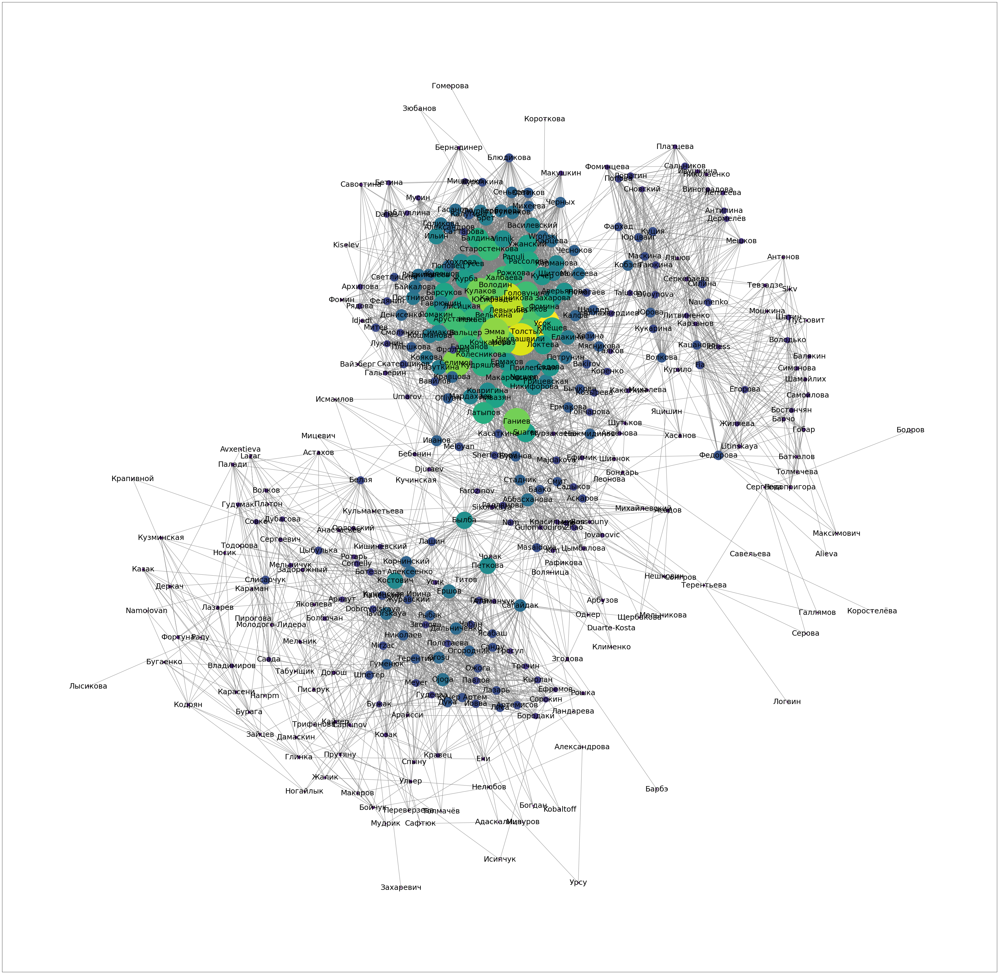

In [ ]:
matrixG = get_matrix_graph(G)
params = drawing_nodes_params(matrixG)
keys = ['G', 'pos','node_color' 'node_size', 'edge_color']
plt.figure(figsize=(60, 60))
nx.draw_networkx(**params)

I gained a undirected graph with 394 nodes and 5266 edges.

In [ ]:
len(G.nodes) # the friends which had as mutual friend only me have disappeared => 394 out of 401 friends were received.

394

In [ ]:
len(G.edges)

5266

## Description Characteristics of Graph

Due to the fact that our graph has 4 connected components, the diameter and radius cannot be calculated for the whole graph. In this way I decided to compute it for each component.

In [ ]:
print(' The average_clustering coefficient equals to', round(nx.average_clustering(G),2))

 The average_clustering coefficient equals to 0.54


In [ ]:
clustering = nx.clustering(G) # clustering coeff per node

In [ ]:
fig = px.histogram(clustering.values(),title='Histogram of Clustering Coefficient', color_discrete_sequence=["rgb(166,216,84)"],width=600, height=500)
fig.update_layout(showlegend = False)
fig.show()

In [ ]:
def cc_char(G):
  list_of_cc = list(nx.connected_components(G))
  list_of_sub_g = [G.subgraph(cc) for cc in list_of_cc]
  subg_char = {}
  for i in range(len(list_of_sub_g)):
    subg_char[i] = {'nodes_count' : len(list_of_sub_g[i]),
                    'diameter' : nx.diameter(list_of_sub_g[i]),
                    'radius' : nx.radius(list_of_sub_g[i]),
                    'clustering_coeff_avg' : round(nx.average_clustering(list_of_sub_g[i]),2),
                    'avg_path_length' : round(nx.average_shortest_path_length(list_of_sub_g[i]),2)}
  return subg_char, list_of_cc

In [ ]:
subg_char = cc_char(G)[0]
subg_char

{0: {'avg_path_length': 2.99,
  'clustering_coeff_avg': 0.55,
  'diameter': 7,
  'nodes_count': 386,
  'radius': 4},
 1: {'avg_path_length': 1.33,
  'clustering_coeff_avg': 0.58,
  'diameter': 2,
  'nodes_count': 4,
  'radius': 1},
 2: {'avg_path_length': 1.0,
  'clustering_coeff_avg': 0.0,
  'diameter': 1,
  'nodes_count': 2,
  'radius': 1},
 3: {'avg_path_length': 1.0,
  'clustering_coeff_avg': 0.0,
  'diameter': 1,
  'nodes_count': 2,
  'radius': 1}}

In [ ]:
pd.DataFrame.from_dict({0: {'avg_path_length': 2.99,
  'clustering_coeff_avg': 0.55,
  'diameter': 7,
  'nodes_count': 386,
  'radius': 4}})

,0
avg_path_length,2.99
clustering_coeff_avg,0.55
diameter,7.00
nodes_count,386.00
radius,4.00


**Interpretation**

  The largest cc has 386 nodes. The diameter is equal to 7 which means that the largest shortest path is 7. The distance between the two furthest friends is 7 (there are 7 friends between them. Radius equals 4 (the minimum eccentricity is 4.). The average shortest path is equal approximately to 3, which means that on average shortest path between all pairs of nodes is equal to 3. In general, the clustering coefficient captures the degree to which the neighbors of a given node link to each other. The degree of clustering of a whole network is captured by the average clustering coefficient. The avg clustering coefficient is equal to 0.55.


  The second cc has 4 nodes. The diameter is equal to 2 which means that the largest shortest path is 2. Radius equals 1 (the minimum eccentricity is 1.) The distance between the two furthest friends is 2 (there are 2 friends between them). The average shortest path is equal approximately to 1.3, which means that the average shortest path between all pairs of nodes is equal to 1.3. The degree of clustering of a whole network is captured by the average clustering coefficient. The avg clustering coefficient is equal to 0.58.

  The third cc has 2 nodes. The diameter is equal to 2 which means that the largest shortest path is 2. Radius equals 1 (the minimum eccentricity is 1.). The distance between the two furthest friends is 2 (there are 2 friends between them). The average shortest path is equal approximately to 1, which means that the average shortest path between all pairs of nodes is equal to 1. It is obvious that the average clustering coefficient is equal to 0.
  
  The fourth cc has 2 nodes. The diameter is equal to 2 which means that the largest shortest path is 2. Radius equals 1 (the minimum eccentricity is 1.). It is obvious that the average clustering coefficient is equal to 0.



Let visualize the cc.

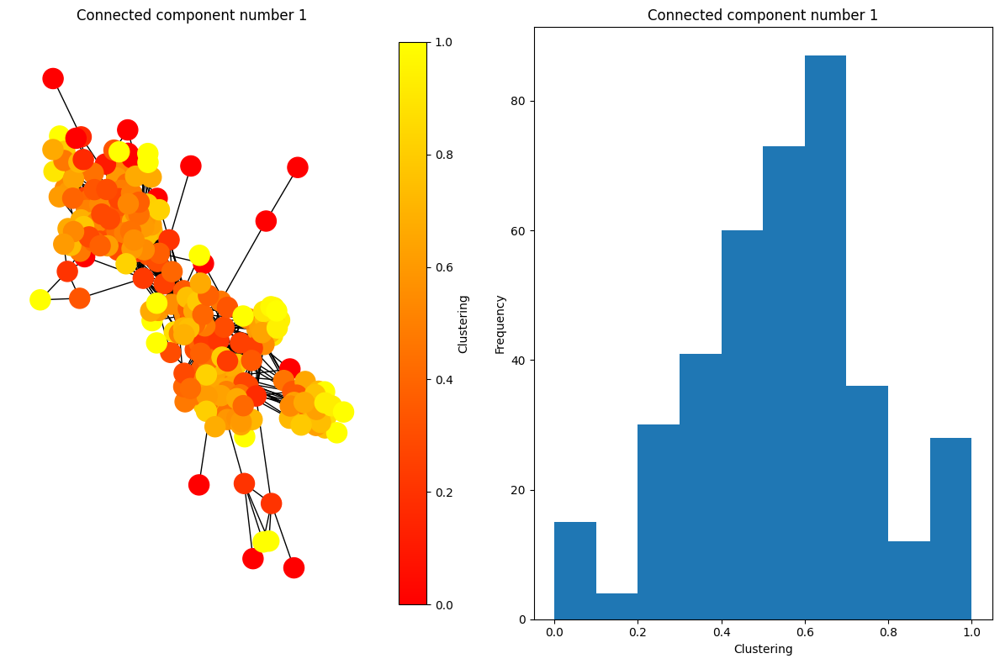

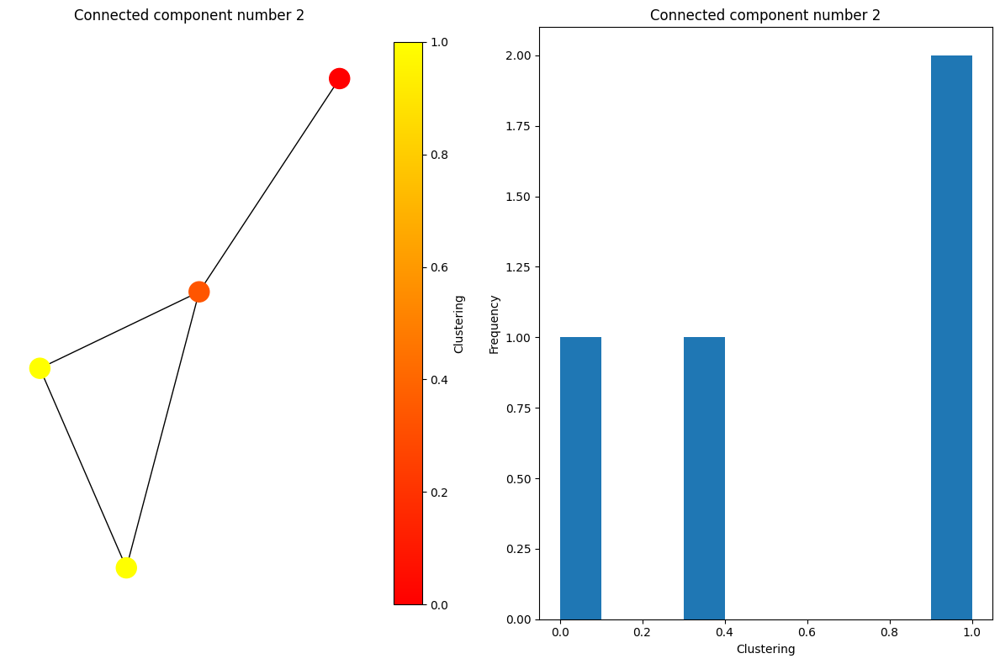

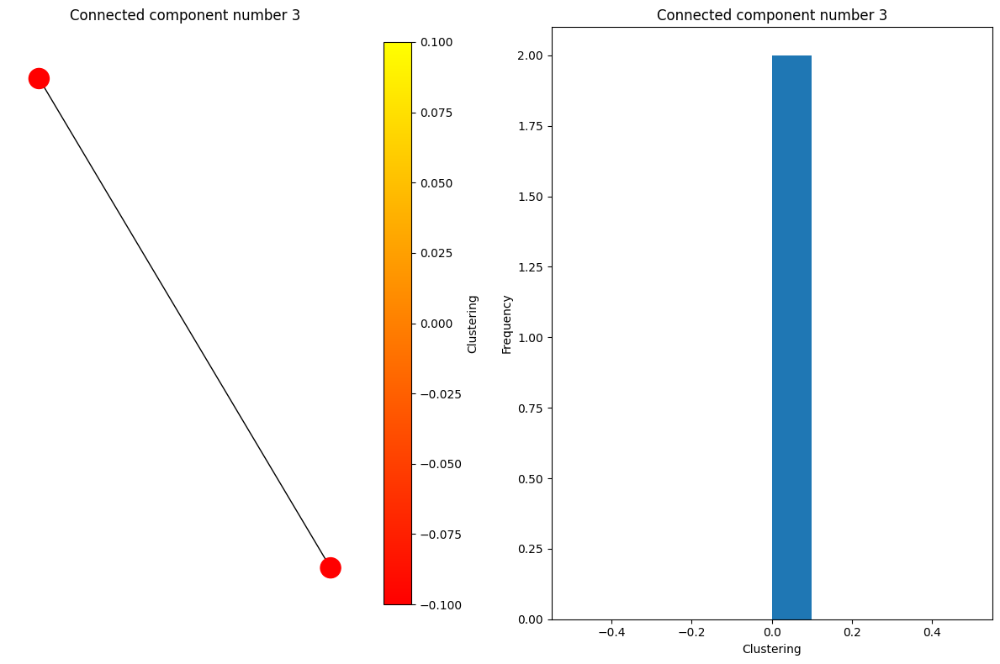

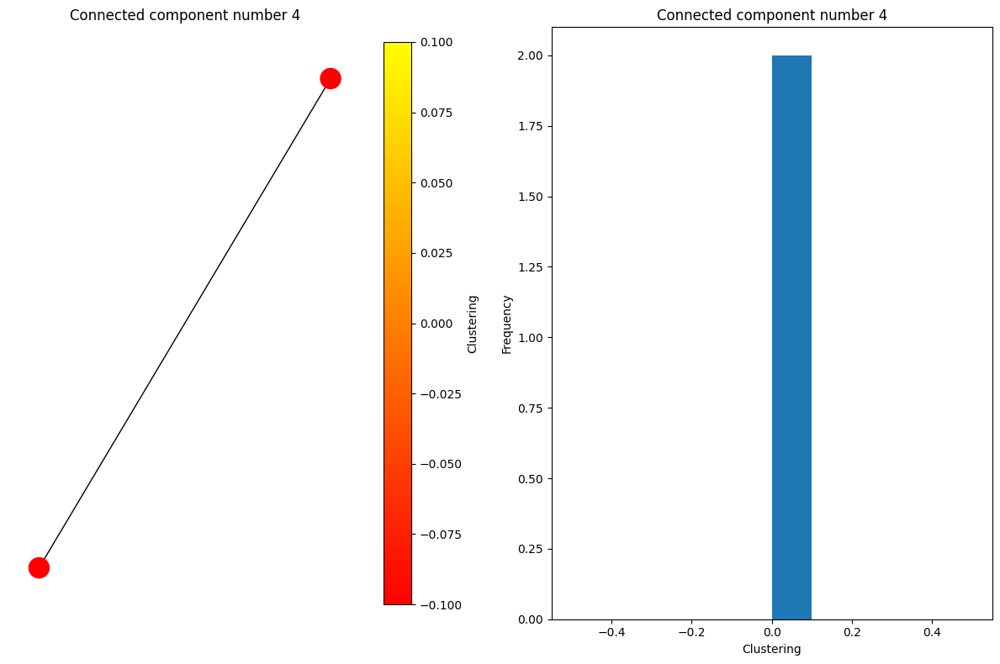

In [ ]:
def plt_cc(sub_graph):  # inspired by func in StackOverflow

  lcc = nx.clustering(sub_graph)
  cmap = plt.get_cmap('autumn')
  norm = plt.Normalize(0, max(lcc.values()))
  node_colors = [cmap(norm(lcc[node])) for node in sub_graph.nodes]

  fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 8))
  nx.draw_spring(sub_graph, node_color=node_colors, with_labels=False, ax=ax1)
  fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.95, ax=ax1)
  ax1.set_title('Connected component number {}'.format(i+1))

  ax2.hist(lcc.values(), bins=10)
  ax2.set_xlabel('Clustering')
  ax2.set_ylabel('Frequency')

  plt.tight_layout()
  plt.title('Connected component number {}'.format(i+1))
  plt.show()

list_of_cc = cc_char(G)[1]

for i in range(len(list_of_cc)):
  sub_graph = G.subgraph(list_of_cc[i])
  plt_cc(sub_graph)

In [ ]:
degree_hist = nx.degree_histogram(G) 
degree_hist = np.array(degree_hist, dtype=float)
degree_prob = degree_hist/G.number_of_nodes()

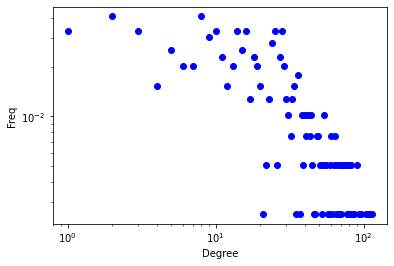

In [ ]:
plt.plot(range(len(degree_prob)),degree_prob,'bo')
plt.yscale('log')
plt.xscale('log')
plt.ylabel('Freq')
plt.xlabel('Degree')
plt.show()

In [ ]:
fig = px.histogram(degree_hist, nbins = 35, title='Histogram of Degree Distribution',  labels={'x':'Clustering', 'y':'Frequency'}, color_discrete_sequence=["rgb(166,216,84)"],width=600, height=500)
fig.update_layout(showlegend = False)
fig.show()

Looks like Power Law. Let`s check how my degree distribution is closed to Power Law. For this purpose we should use Kolmogorov-Smirnov test.

Firstly, we should generate Power Law Distribution.


In [ ]:
def power_law_pdf(x, alpha, x_min):

    C = (alpha - 1) / x_min ** (1 - alpha)
    
    return C * x ** (-alpha)

def power_law_cdf(x, alpha, x_min):

     alpha = alpha
     x_min = x_min
     func_1 = power_law_pdf

     if type(x) == float or type(x) == int:
       alpha = alpha
       x_min = x_min
       func_1 = power_law_pdf
       result = integrate.quad(func_1, x, np.inf, args=(alpha,x_min))[0]
       cdf = 1 - result
       
     else:
        cdf = []
        for point in x:
            result = integrate.quad(func_1, point, np.inf, args=(alpha,x_min))[0]
            cdf_1 = 1 - result
            cdf.append(cdf_1)

     
     return cdf


def power_law_ppf(r, alpha, x_min):
  
  C = (alpha - 1) / x_min ** (1 - alpha)
  result = (((1-alpha)*(r-1))/C)**(1/(1-alpha))

  return result


def power_law_generate(n, alpha=3.5, x_min=1, random_seed=1):
    np.random.seed(random_seed)
    uni_sample = np.random.uniform(0, 0.999, n)
    return power_law_ppf(uni_sample, alpha, x_min)

In [ ]:
test = stats.kstest(degree_hist, cdf= lambda x: power_law_cdf(power_law_generate(115, 3.5, 3), alpha=3.5, x_min=3))

In [ ]:
print('K-S test {}'.format(round(test[0],3)), 'p-value {}'.format(round(test[1],3)))

K-S test 0.934 p-value 0.0


Since the p-value is less than 0.05, we  reject the null hypothesis. We have sufficient evidence to say that the sample data does not come from a Power Law  distribution.

In [ ]:
degree_cdf = [degree_hist, degree_prob]

###  Estimation of alpha with linear binning 

In [ ]:
def alpha_lin_bins(x_train, bins):

    hist, bin_edges = np.histogram(x_train, bins=bins, density=True)
    bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
    x = np.log(bin_centers[hist > 0]).reshape(-1, 1)
    y = np.log(hist[hist > 0])
    model = LinearRegression().fit(x, y)
    
    return abs(model.coef_)

In [ ]:
bins = 100
x_train = degree_prob
round(alpha_lin_bins(x_train, bins)[0],2)

0.63

In [ ]:
test = stats.kstest(degree_hist, cdf= lambda x: power_law_cdf(power_law_generate(115, 0.63, 1), alpha=0.63, x_min=1))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: IntegrationWarning: The integral is probably divergent, or slowly convergent.


In [ ]:
print('K-S test {}'.format(round(test[0],3)), 'p-value {}'.format(round(test[1],3)))

K-S test 0.934 p-value 0.0


Since the p-value is less than 0.05, we reject the null hypothesis. We have sufficient evidence to say that the sample data does not come from a Power Law distribution.

Degree distribution is not Power Law (it has a shape of PWI because most of social networks are scaled free) because less nodes in graph should have greater degree. Scale-free networks have no much nodes with high degree. According to PWL graph On the right is a long tail, and on the left are the few that dominate. ((My graph has approximately 35 nodes (according to histogram) with high degree value)

# Structural Analysis

### Let build the closest random graph model similar to my social network.

Let collect all statistic of my graph together in a table.

In [ ]:
my_dict = {
    'number_of_nodes' : len(G.nodes),
    'number_of_cc' : len(list_of_cc),
    'radius' : subg_char[0]['radius'],
    'diameter' : subg_char[0]['diameter'],
    'avg_clustering' : round(nx.average_clustering(G), 2),
    'average_path_length' : subg_char[0]['avg_path_length'],
    'K-S test' : round(test[0], 2)
}

df_stat =  pd.DataFrame.from_dict([my_dict])

In [ ]:
df_stat

,number_of_nodes,number_of_cc,radius,diameter,avg_clustering,average_path_length,K-S test
0,394,4,4,7,0.54,2.99,0.93


Let generate random graph from Power Law distribution. To do this we should generate a random degree sequence using Inverse Transform Sampling.

In [ ]:
z = power_law_generate(394, alpha=1.85, x_min=1)

In [ ]:
z = list(map(lambda x: int(x), z))

In [ ]:
G = nx.configuration_model(z)

In [ ]:
H  = G.subgraph(list(nx.connected_components(G))[0])

In [ ]:
degree_hist2 = nx.degree_histogram(H) 
degree_hist2 = np.array(degree_hist2, dtype=float)

In [ ]:
test_2 = stats.kstest(degree_hist2, cdf= lambda x: power_law_cdf(power_law_generate(732, 3.5, 3), alpha=3.5, x_min=3))

In [ ]:
test_2

KstestResult(statistic=0.9408793260709022, pvalue=0.0)

In [ ]:
random_graph = {
    'number_of_nodes' : len(G.nodes),
    'number_of_cc' : nx.number_connected_components(G),
    'radius' : nx.radius(H), # giant cc
    'diameter' : nx.diameter(H), # giant cc
    'average_path_length' : round(nx.average_shortest_path_length(H), 2),
    'K-S test' : round(test_2[0], 2)

}

In [ ]:
df_random = pd.DataFrame.from_dict([random_graph])

In [ ]:
df_random

,number_of_nodes,number_of_cc,radius,diameter,average_path_length,K-S test
0,394,6,4,7,2.78,0.94


I managed to random graph with approximately similar statistics. Graphs are similar to each other, I think the performance will be more or less equal.

In my project will be more logic to compare my ego network with BA model because degree distribution of my network is more or less simillar to Power Law. In BA model degrees are distributed according to power law. Also, will be interesting to compare my ego network with Small-World.

In [ ]:
avg_node_degree = 2*len(G.edges)/len(G.nodes)

In [ ]:
avg_node_degree

26.730964467005077

In [ ]:
BA = nx.barabasi_albert_graph(394,28)

In [ ]:
nx.radius(BA)

2

In [ ]:
nx.diameter(BA)

3

In [ ]:
round(nx.average_clustering(BA),2)

0.22

In [ ]:
nx.average_shortest_path_length(BA)

1.873109363092701

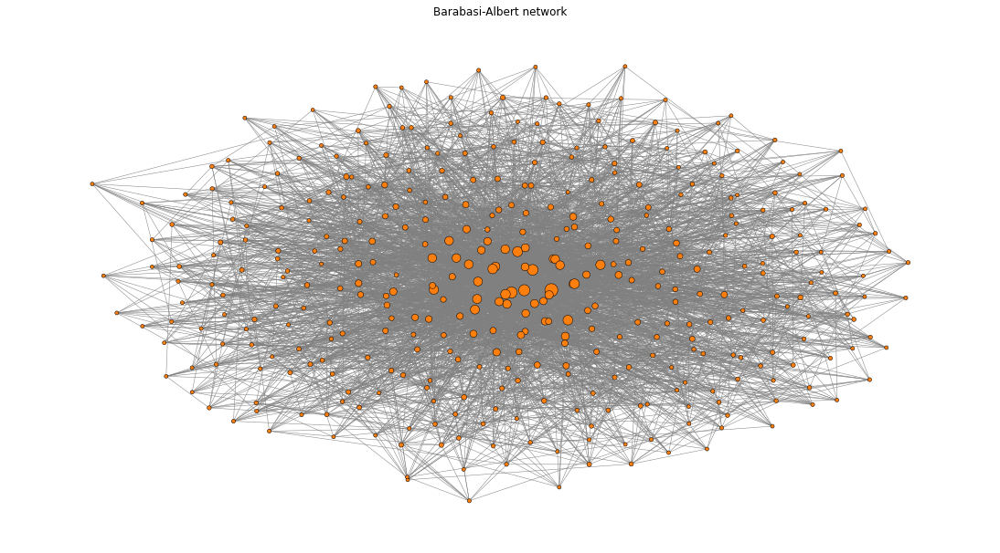

In [ ]:
plt.figure(figsize=(15, 8))
sizes = np.array(list(nx.degree_centrality(BA).values()))
sizes = sizes / max(sizes) * 200
pos = nx.layout.spring_layout(BA)
nx.draw(
            BA,
            pos=pos,
            with_labels=False, 
            node_size=sizes, 
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            node_color='tab:orange',
            edge_color = 'grey')
plt.title('Barabasi-Albert network');

To set the number k in WS graph let me calculate the average degree of my ego-network. Average degree is simply the average number of edges per node in the graph.

In [ ]:
avg_degree = (2*len(G.edges)) /len(G.nodes)

In [ ]:
print('Average degree is {}'.format(round(avg_degree),2))

Average degree is 27


So, let generate Small-World graph with 394 nodes, and degree k = 27

In [ ]:
WS = nx.watts_strogatz_graph(n = 394, k = 27, p = 0.5)

In [ ]:
nx.radius(WS)

3

In [ ]:
nx.diameter(WS)

3

In [ ]:
round(nx.average_clustering(WS),2)

0.14

In [ ]:
print('Average path length of VK graph is equal {}'.format(round(np.log(len(G.nodes))),3))

Average path length of VK graph is equal 6


We can conclude that theory of six handshakes may work on VK graph.

Let have a look on WS graph.

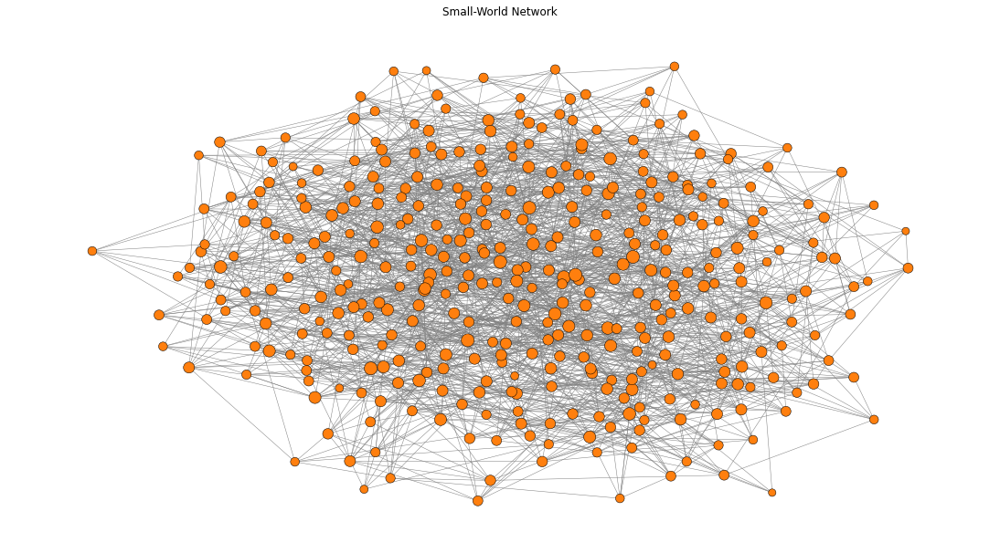

In [ ]:
plt.figure(figsize=(15, 8))
sizes = np.array(list(nx.degree_centrality(WS).values()))
sizes = sizes / max(sizes) * 200
pos = nx.layout.spring_layout(WS)
nx.draw(
            WS,
            pos=pos,
            with_labels=False, 
            node_size=sizes, 
            width=0.5,
            linewidths=0.5,
            edgecolors='black',
            node_color='tab:orange',
            edge_color = 'grey')
plt.title('Small-World Network')
plt.show()

VK graph has degree distribution like BA model, large diameter like BA and WS model, large avg clustering coefficient like WS. 

### Degree/Closeness/Betweenness/Katz/Eigenvector centralities, top nodes description.


In [ ]:
fig = px.histogram(nx.degree_centrality(G).values(), nbins = 35, title='Histogram of Degree Centrality', color_discrete_sequence=["rgb(100,216,84)"],width=600, height=500)
fig.update_layout(showlegend = False)
fig.show()

In [ ]:
fig = px.histogram(nx.closeness_centrality(G).values(), nbins = 35, title='Histogram of Closeness Centrality', color_discrete_sequence=["rgb(100,216,84)"],width=600, height=500)
fig.update_layout(showlegend = False)
fig.show()

In [ ]:
nx.closeness_centrality(G)

In [ ]:
nx.eigenvector_centrality(G)

In [ ]:
fig = px.histogram(nx.eigenvector_centrality(G).values(), nbins = 35, title='Histogram of Eigenvector Centrality', color_discrete_sequence=["rgb(100,216,84)"],width=600, height=500)
fig.update_layout(showlegend = False)
fig.show()

In [ ]:
nx.betweenness_centrality(G)

In [ ]:
fig = px.histogram(nx.betweenness_centrality(G).values(), nbins = 35, title='Histogram of Betweenness Centrality', color_discrete_sequence=["rgb(100,216,84)"],width=600, height=500)
fig.update_layout(showlegend = False)
fig.show()

In [ ]:
fig = px.histogram(nx.katz_centrality_numpy(G).values(), nbins = 35, title='Histogram of Katz Centrality', color_discrete_sequence=["rgb(100,216,84)"],width=600, height=500)
fig.update_layout(showlegend = False)
fig.show()

In [ ]:
def centralities(G):

    return {'degree' : nx.degree_centrality(G),
    'closeness' : nx.closeness_centrality(G),
    'betweenness' : nx.betweenness_centrality(G)}


def top10_centralities(G: nx.Graph):

    top_list = ['degree', 'closeness', 'betweenness']
    my_dict = {}
    for word in top_list:
      top_degree = pd.DataFrame()
      top_degree2 = pd.DataFrame(columns = ['id', 'last_name', 'centrality'])
      list_of_degrees = centralities(G)[word]
      list_top_degree = [(key, val) for key, val in list_of_degrees.items()]
      sorted_top_degree = sorted(list_top_degree, reverse = True, key=lambda x: x[1])[:10]
      for id, val in sorted_top_degree:
        top_degree['id'] = pd.Series(id)
        top_degree['last_name'] = pd.Series(G.nodes[id]['last_name'])
        top_degree['centrality'] = pd.Series(round(val,3))
        top_degree2 = pd.concat([top_degree2, top_degree])
      top_degree2.index = np.arange(0,10)
      my_dict[word] = top_degree2

    return my_dict

In [ ]:
top_dfs = top10_centralities(G)

Degree centrality


,id,last_name,centrality
0,19243810,Усок,0.291
1,147027677,Чиквашвили,0.276
2,136038583,Калашникова,0.268
3,153332143,Левыкина,0.263
4,77471908,Юсифзаде,0.245
5,266865282,Эмма,0.242
6,214329329,Селимов,0.237
7,280377185,Кулаков,0.230
8,310414504,Ганиев,0.230
9,127978616,Толстых,0.219


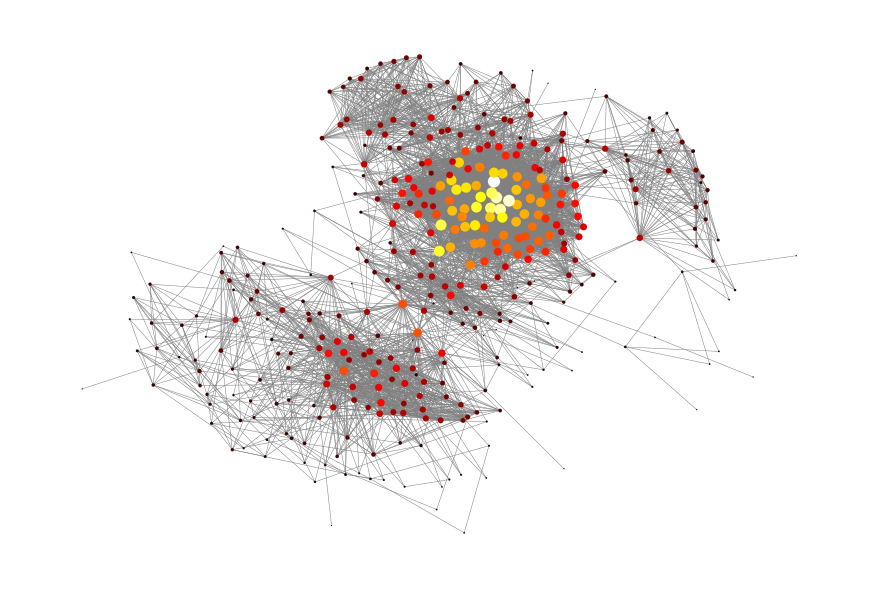

Closeness centrality


,id,last_name,centrality
0,310414504,Ганиев,0.466
1,207019696,Былба,0.446
2,159082036,Петкова,0.446
3,388859317,Suarez,0.445
4,214329329,Селимов,0.439
5,19243810,Усок,0.437
6,444686887,Аббасханова,0.433
7,90885573,Стадник,0.430
8,103935061,Садыков,0.430
9,120209193,Айвазян,0.427


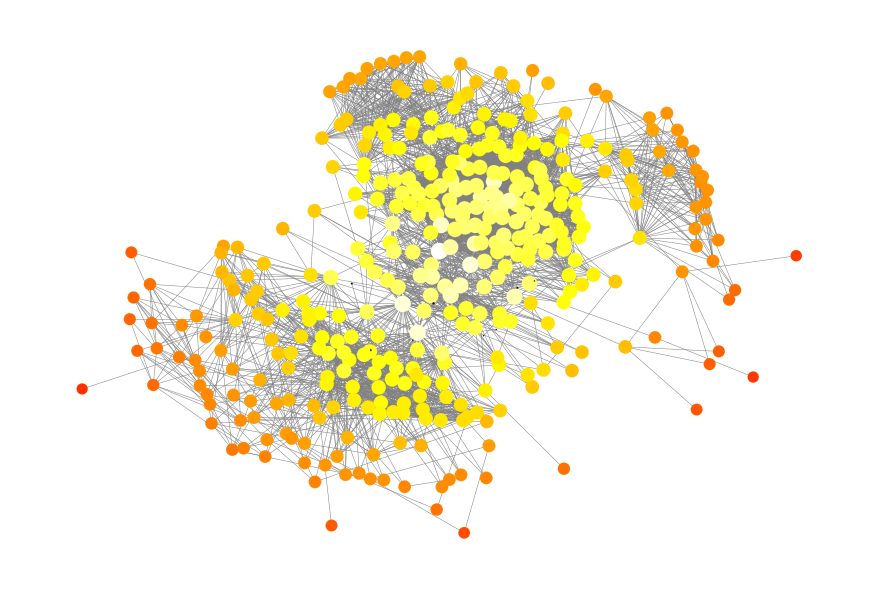

Betweenness centrality


,id,last_name,centrality
0,207019696,Былба,0.124
1,159082036,Петкова,0.122
2,310414504,Ганиев,0.085
3,214329329,Селимов,0.076
4,103935061,Садыков,0.072
5,166542625,Белая,0.071
6,19243810,Усок,0.071
7,388859317,Suarez,0.050
8,238738408,Федорова,0.047
9,155876480,Лашин,0.042


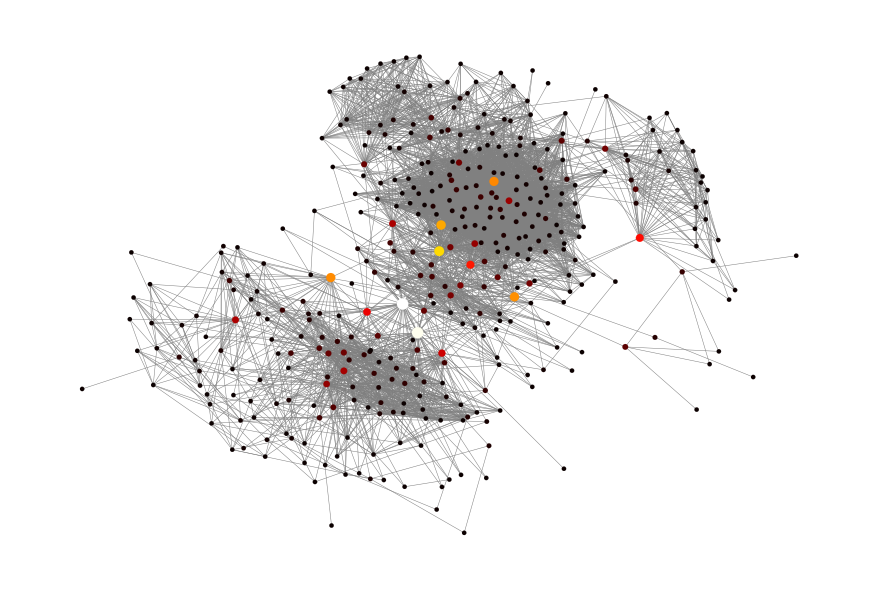

In [ ]:
c = centralities(G)
cases = [['degree', 500, 0, 'Degree centrality'], 
         ['closeness', 600, 0, 'Closeness centrality'], 
         ['betweenness', 900, 20, 'Betweenness centrality']]
for c_key, scale, bias, title in cases:
    print(title)
    display(top_dfs[c_key])
    plt.figure(figsize=(12, 8))
    nx.draw(G, 
            pos = nx.kamada_kawai_layout(G),
            width=0.5,
            linewidths=0.1,
            edge_color='grey',
            cmap=plt.cm.hot,
            node_size=np.fromiter(c[c_key].values(), dtype=float)*scale + bias,
            node_color=np.fromiter(c[c_key].values(), dtype=float)),     
    plt.show()

The degree centrality for a friend is the fraction of friends it is connected to. Top 10 friends have large quantity of connections with others => they have more mutual friends, then others. These users are in the list of top nodes, because I have more connections from university.

The betweenness centrality for each friend in top list have the highest   number of  shortest paths that pass through them.


Users who are in closeness centralities top list have small distance between each other.




### Correlation comparison of centralities

In [ ]:
data = {
    'id': np.array(c['degree'].keys()), 
    'degree': np.fromiter(c['degree'].values(), dtype=float), 
    'betweenness' : np.fromiter(c['betweenness'].values(), dtype=float),
    'closeness' :  np.fromiter(c['closeness'].values(), dtype=float),
    'katz centrality': np.fromiter(nx.katz_centrality_numpy(G).values(), dtype=float),
    'eigenvector centrality': np.fromiter(nx.eigenvector_centrality(G).values(),dtype=float)}
    
df_corr = pd.DataFrame.from_dict(data)

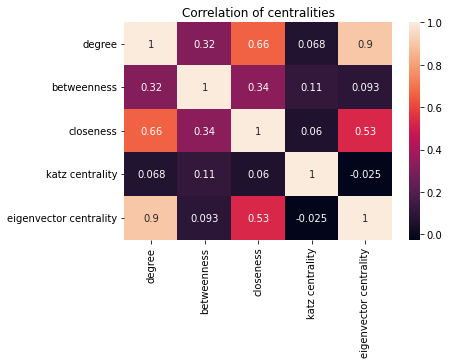

In [ ]:
sns.heatmap(df_corr.iloc[:,1:].corr(), annot=True)
plt.title('Correlation of centralities');

Degree centrality measure correlates more with eigenvector centrality because users with high degree fractions are connected to friends, who have also high degree (high eigen vector score). Therefore, these two measures correlate the most.
Degree centrality measure correlates with closeness since users who have a lot of connections with other users can have more shortest ways pass through them.

### Assortative mixing by node attributes and node degree.

Assortative Mixing by node attributes.

Let me provide assortative mixing by attribute 'city'.

In [ ]:
def city_mixing(G):

  list_of_atr = []
  my_dict = {}
  matrix = nx.attribute_mixing_matrix(G, attribute='city_wht_id')
  for node, dicty in G.nodes(data=True):
    try:
      list_of_atr.append(dicty['city_wht_id'])
    except KeyError:
      continue
  set_l = set(list_of_atr)
  for genre, i  in zip(set_l, range(matrix.shape[0])):
      my_dict[genre] = i
      
  return (matrix, my_dict)

In [ ]:
mixing, mapping = city_mixing(G)

In [ ]:
mixing = np.around(mixing, 2)

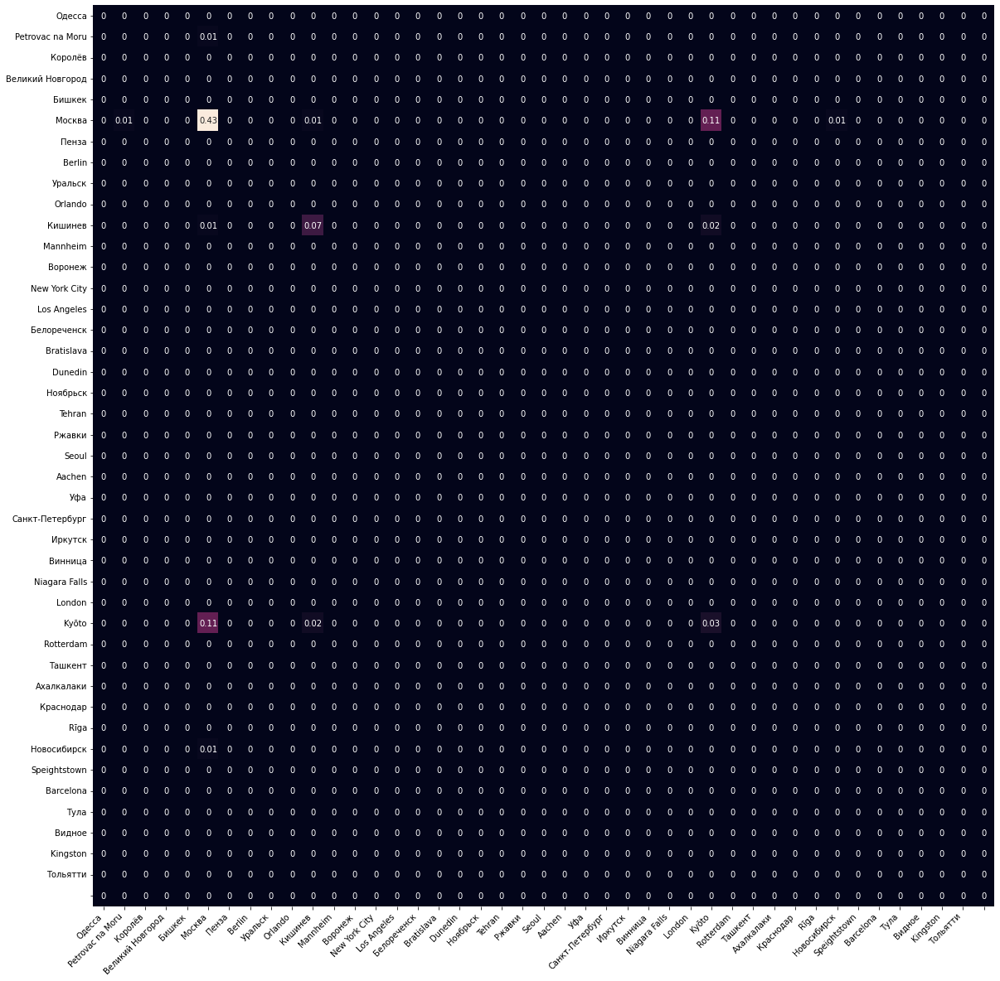

In [ ]:
fig = plt.figure(figsize=(20, 20))
hmap = sns.heatmap(
    mixing,
    cbar=False,
    annot=True,
    square=True)
hmap.set_xticklabels(
    labels=[m for m in mapping], 
    rotation=45, 
    horizontalalignment='right')
hmap.set_yticklabels(
    labels=[m for m in mapping], 
    rotation=0)
plt.show()

In [ ]:
def sex_mixing(G):

  list_of_atr = []
  my_dict = {}
  matrix = nx.attribute_mixing_matrix(G, attribute='sex')
  for node, dicty in G.nodes(data=True):
    try:
      list_of_atr.append(dicty['sex'])
    except KeyError:
      continue
  set_l = set(list_of_atr)
  for genre, i  in zip(set_l, range(matrix.shape[0])):
      my_dict[genre] = i
      
  return (matrix, my_dict)

In [ ]:
mixing, mapping = sex_mixing(G)

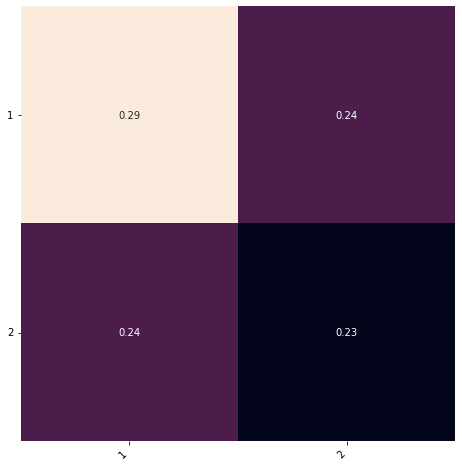

In [ ]:
fig = plt.figure(figsize=(8, 8))
hmap = sns.heatmap(
    mixing,
    cbar=False,
    annot=True,
    square=True)
hmap.set_xticklabels(
    labels=[m for m in mapping], 
    rotation=45, 
    horizontalalignment='right')
hmap.set_yticklabels(
    labels=[m for m in mapping], 
    rotation=0)
plt.show()

In [ ]:
def university_name_mixing(G):

  list_of_atr = []
  my_dict = {}
  matrix = nx.attribute_mixing_matrix(G, attribute='university_name')
  for node, dicty in G.nodes(data=True):
    try:
      list_of_atr.append(dicty['university_name'])
    except KeyError:
      continue
  set_l = set(list_of_atr)
  for genre, i  in zip(set_l, range(matrix.shape[0])):
      my_dict[genre] = i
      
  return (matrix, my_dict)

In [ ]:
mixing, mapping = university_name_mixing(G)

In [ ]:
mixing = np.around(mixing, 2)

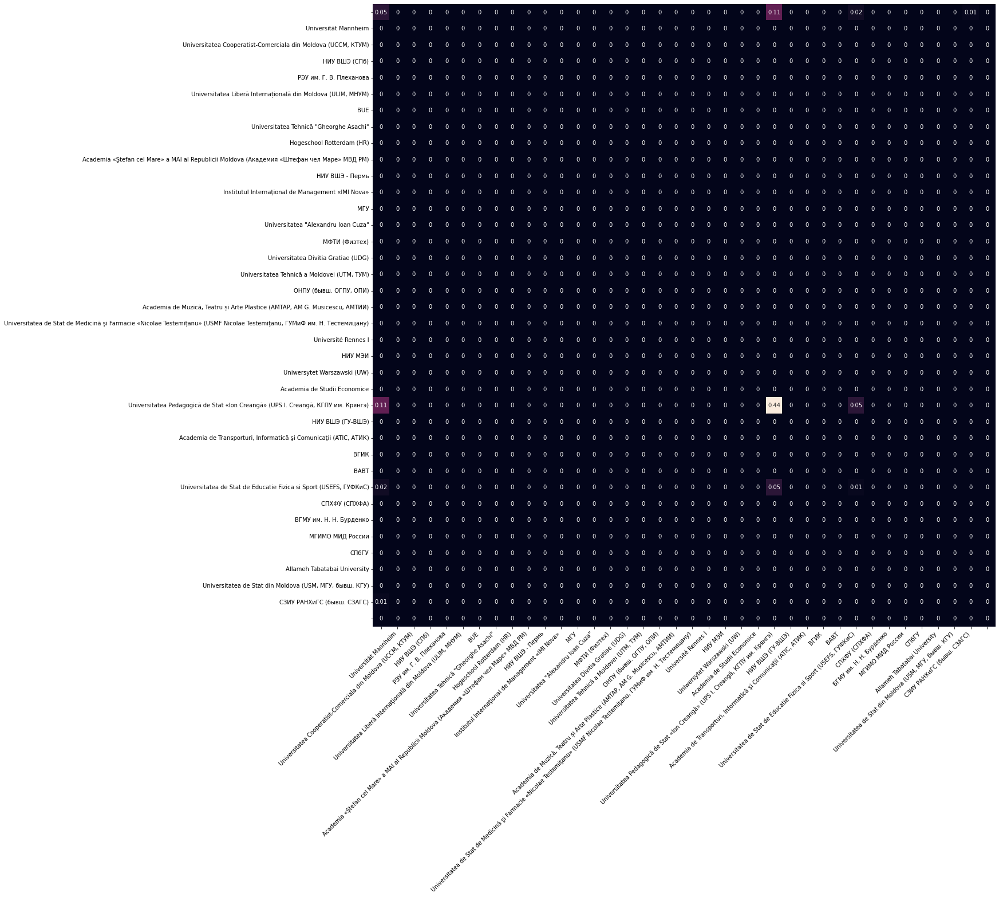

In [ ]:
fig = plt.figure(figsize=(20, 20))
hmap = sns.heatmap(
    mixing,
    cbar=False,
    annot=True,
    square=True)
hmap.set_xticklabels(
    labels=[m for m in mapping], 
    rotation=45, 
    horizontalalignment='right')
hmap.set_yticklabels(
    labels=[m for m in mapping], 
    rotation=0)
plt.show()

Female users have large assortative mixing because they contacts more with other female users. Assortative mixing with other labels is very low.

Assortative Mixing by degree

In [ ]:
arr = nx.degree_mixing_matrix(G)

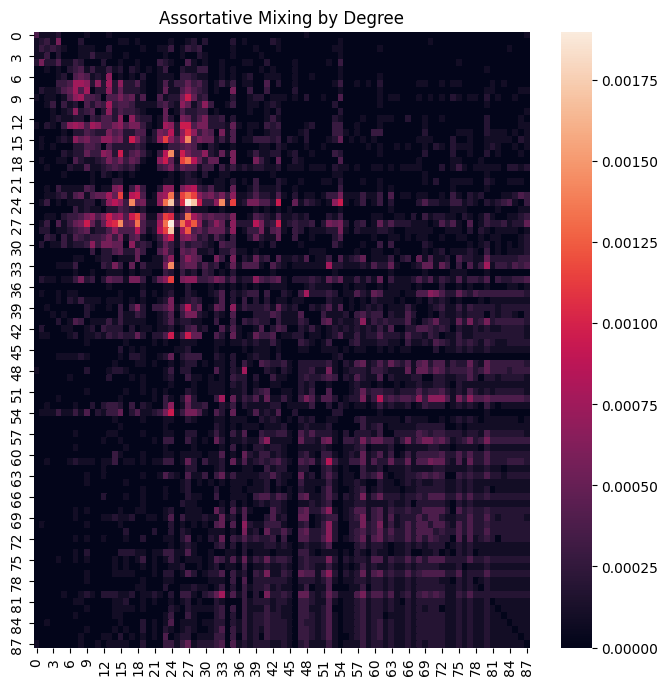

In [ ]:
fig = plt.figure(figsize=(8, 8))
sns.heatmap(arr)
plt.title('Assortative Mixing by Degree');

Low degrees nodes are closed to the users with few mutual friends, with high degree vertices is vise a verse.  

### Node structural equivalence/similarity.


Structural equivalence will be not implemented, because my ego-network is an undirected graph. 

In [ ]:
def sim_matrices(G):


  for i, node in enumerate(list(G.nodes)):
    G.nodes[node].update({'number' : i})

  adj_matrix = nx.to_numpy_array(G)

  corr_mat = np.corrcoef(adj_matrix)

  jac_mat = np.zeros(shape=(adj_matrix.shape[0],adj_matrix.shape[1]))
  for node1, node2, res in list(nx.jaccard_coefficient(G)):
    u = G.nodes[node1]['number']
    v = G.nodes[node2]['number']
    jac_mat[u][v] = res
  np.fill_diagonal(jac_mat, 1, wrap=False)

  cos_mat = cosine_similarity(adj_matrix)
  return (adj_matrix, corr_mat, jac_mat, cos_mat)

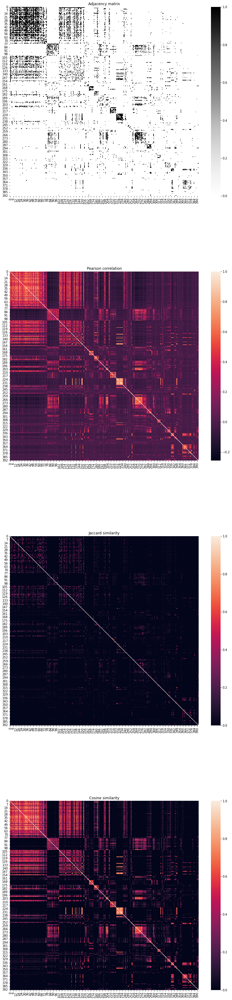

In [ ]:
A, corr, J, cos = sim_matrices(G)
fig = plt.figure(figsize=(15, 15*4))    # from homework
plt.subplots_adjust(hspace=0.4, wspace=0.4)
cases = [[1, A, plt.cm.Greys, 'Adjacency matrix'], 
         [2, corr, None, 'Pearson correlation'], 
         [3, J, None, 'Jaccard similarity'], 
         [4, cos, None, 'Cosine similarity'], ]
for i, matrix, cmap, t in cases:
    plt.subplot(4, 1, i)
    hmap = sns.heatmap(
        matrix,
        cmap=cmap,
        square=True)
    plt.title(t)

## Community Detection

### Clique search, k-cores visualization.

In [ ]:
lst_of_clique = list(nx.clique.find_cliques(G))

In [ ]:
len(lst_of_clique)

15355

In [ ]:
nx.graph_clique_number(G)

24

In [ ]:
sub_g = [G.subgraph(nodes = clique) for clique in lst_of_clique]

In [ ]:
matrixH = get_matrix_graph(sub_g[0])

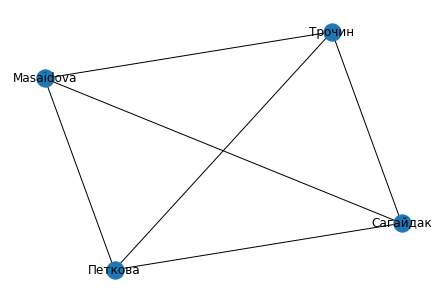

In [ ]:
nx.draw(matrixH, with_labels = True)

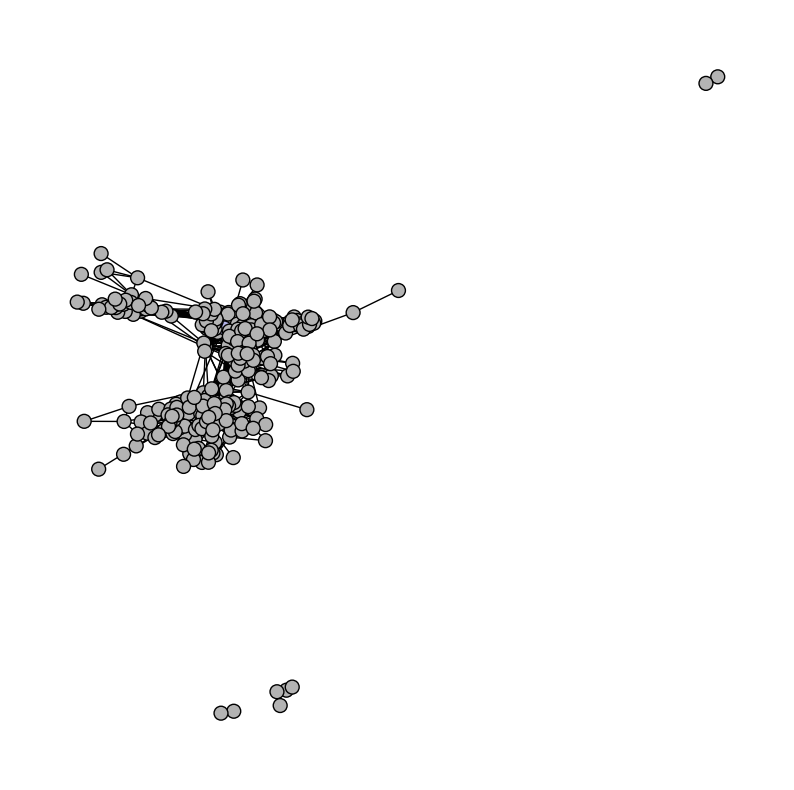

In [ ]:
    pos = nx.spring_layout(G)
    plt.rcParams.update(plt.rcParamsDefault)
    plt.rcParams.update({'figure.figsize': (10, 10)})  # from the internet
    cliques = list(nx.find_cliques(G))
    max_clique = max(cliques, key=len)
    node_color = [(0.7, 0.7, 0.7) for v in G.nodes()]
    for i, v in enumerate(G.nodes()):
        if v in max_clique:
            node_color[i] = (0.7, 0.7, 0.9)
    nx.draw_networkx(G,cmap=plt.cm.rainbow, node_color=node_color, pos=pos, with_labels=False, node_size=100, edgecolors='black')
    plt.axis('off')
    plt.show()

In [ ]:
lab = [G.nodes[node]['last_name'] for node in G.nodes]

### K-core visualization

In [ ]:
labels = np.fromiter(nx.core_number(G).values(),dtype=int)

In [ ]:
len(pd.Series(labels).unique())

31

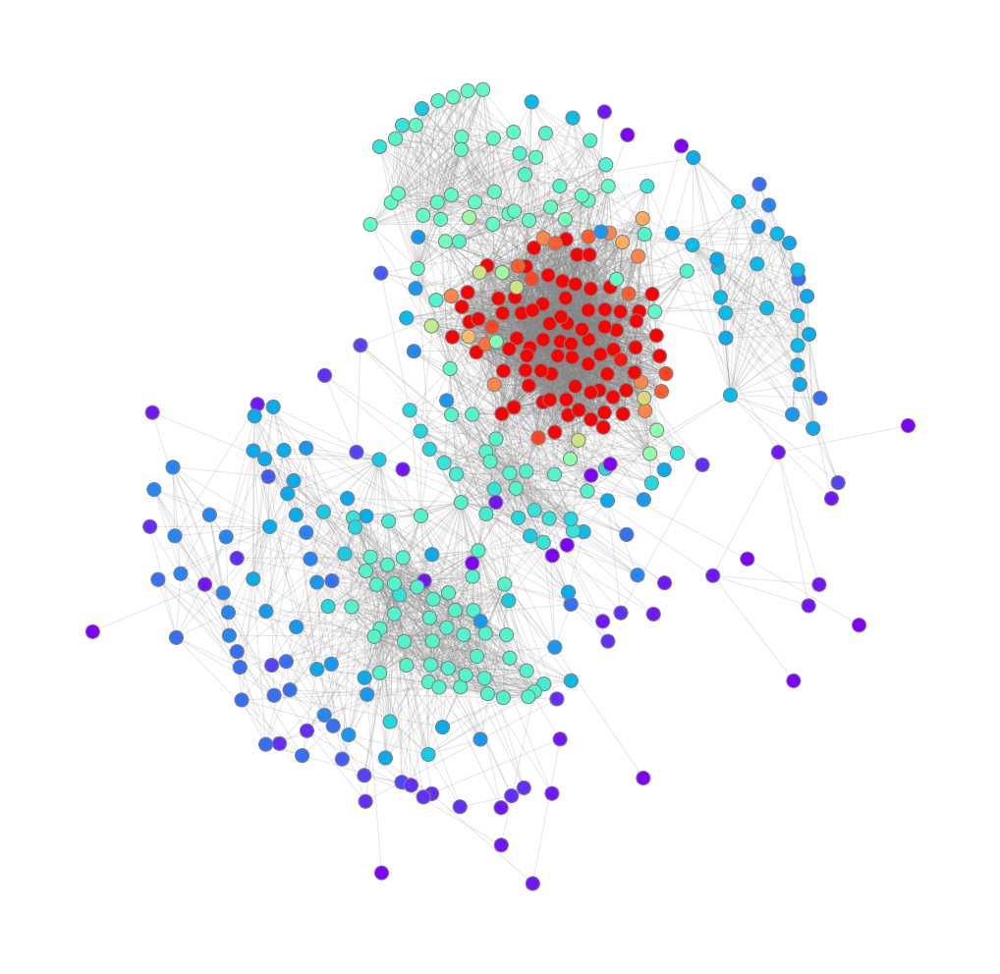

In [ ]:
labels = np.fromiter(nx.core_number(G).values(),dtype=int)
lespos = nx.kamada_kawai_layout(G)
plt.figure(figsize=(18, 18))
nx.draw_networkx_nodes(
    G, 
    lespos,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=200, 
    linewidths=1, 
    edgecolors='grey',
)
nx.draw_networkx_edges(
    G,
    lespos,
    alpha=0.2,
    edge_color='grey'
)

plt.axis('off')
plt.show()

In [ ]:
matrixG = get_matrix_graph(G)
matrixG .remove_edges_from(nx.selfloop_edges(matrixG))

In [ ]:
lespos = nx.kamada_kawai_layout(G)

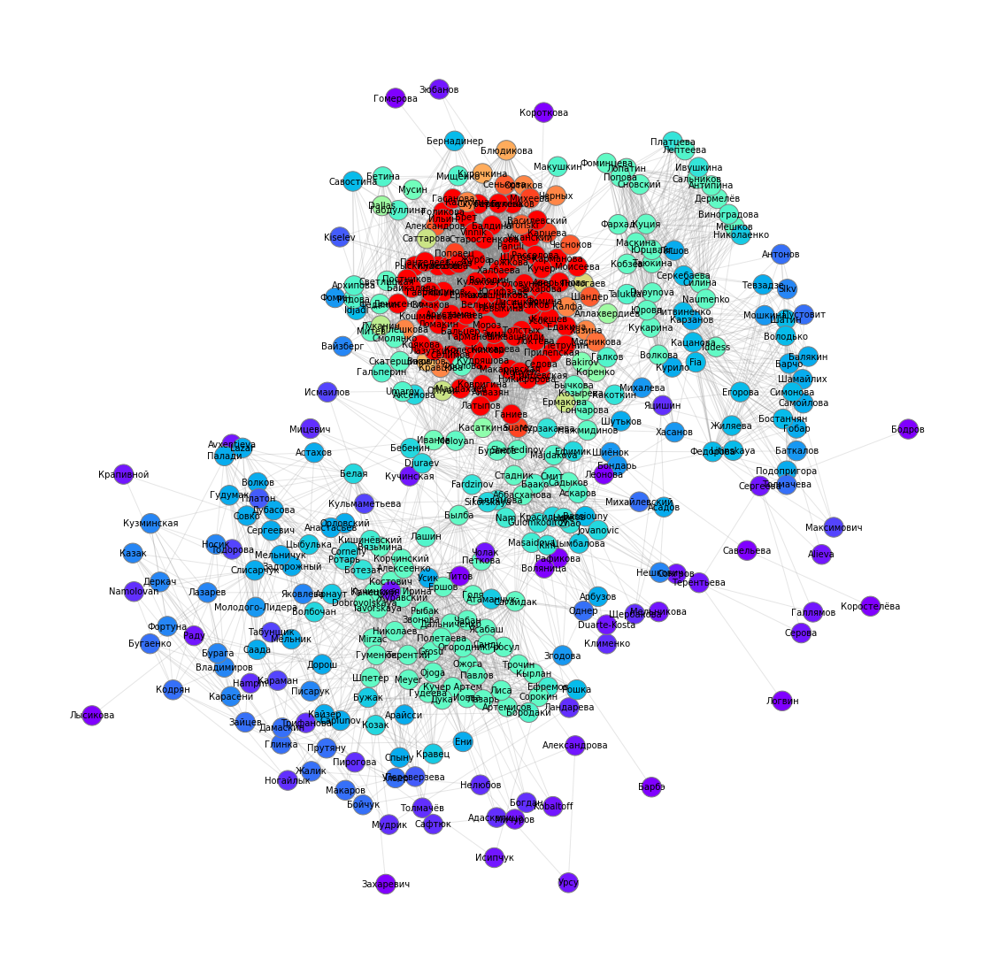

In [ ]:
labels = np.fromiter(nx.core_number(matrixG).values(),dtype=int)
lespos = nx.kamada_kawai_layout(matrixG)
plt.figure(figsize=(20, 20))
nx.draw_networkx_nodes(
    matrixG, 
    lespos,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=500, 
    linewidths=1, 
    edgecolors='grey',
)
nx.draw_networkx_edges(
    matrixG,
    lespos,
    alpha=0.2,
    edge_color='grey'
)

nx.draw_networkx_labels(
    matrixG, 
    pos = lespos,
    font_size=10)

plt.axis('off')
plt.show()

### Best results of various community detection algorithms, both in terms of interpretation and some quality criterion (modularity, silhouette, ground truth partition).

## Spectral Clustering

In [ ]:
def norm_laplacian(A,G):

  n = len(G)
  degrees = [deg for node, deg in G.degree()]
  D = np.diag(np.full(n,degrees))
  A = nx.to_numpy_array(G)
  L = D - A
  d = D**(-1/2)
  d[d == inf] = 0
  norm_l = d@L@d
  
  return norm_l

In [ ]:
A = nx.to_numpy_array(G)
L = norm_laplacian(A,G)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in power
  


In [ ]:
def spectral_embedding(L, n_components):

  res = sklearn.manifold.spectral_embedding(A)[:,:n_components]
  
  return res

In [ ]:
embedding = spectral_embedding(L, 3)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
def spectral_clustering(G, n_clusters, n_components):
    A = nx.to_numpy_array(G)
    L = norm_laplacian(A,G)
    embedding = spectral_embedding(L, n_components)
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(embedding)
    return kmeans.labels_

In [ ]:
embedding = spectral_embedding(L, 4)
labels = spectral_clustering(G, 35, 4)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in power
  


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in power
  
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


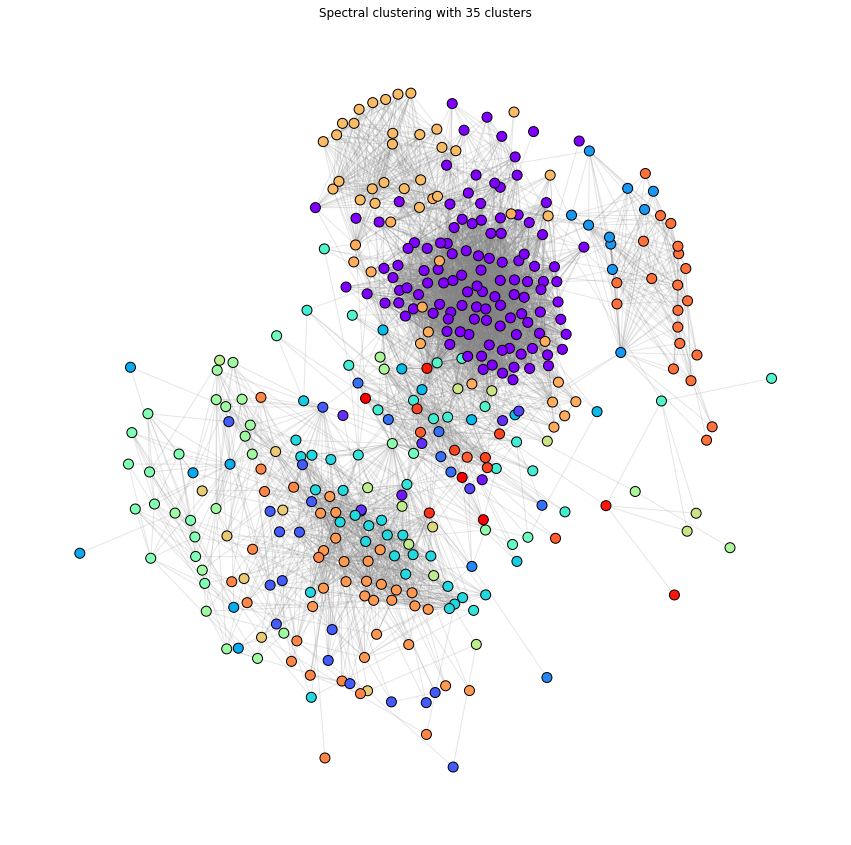

In [ ]:
labels = spectral_clustering(G, 35, 4)
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(
    G, 
    lespos,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=100, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(
    G,
    lespos,
    alpha=0.2,
    edge_color='grey'
)
plt.axis('off')
plt.title('Spectral clustering with 35 clusters')
plt.show()

In [ ]:
embedding = spectral_embedding(L, 4)
labels = spectral_clustering(G,6, 4)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in power
  


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in power
  
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


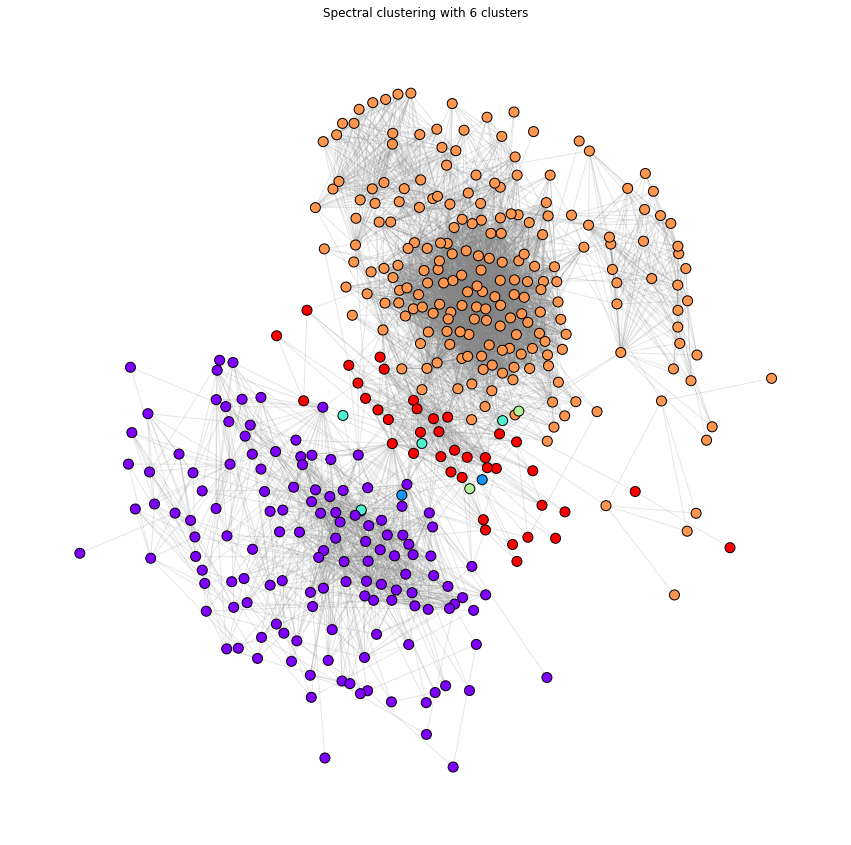

In [ ]:
labels = spectral_clustering(G,6, 4)
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(
    G, 
    lespos,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=100, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(
    G,
    lespos,
    alpha=0.2,
    edge_color='grey'
)
plt.axis('off')
plt.title('Spectral clustering with 6 clusters')
plt.show()

Spectral clustering detects correctly users from the same cities. Also this algo distinguishes well people who migrated from Chisinau to Moscow. 6 clusters were chosen because I have 6 groups of people (from two schools, university, and 3 teaching assisntant grouos). 

### Agglomerative clustering 

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from sklearn.cluster import AgglomerativeClustering

In [ ]:
def simrank_distance(G):

  sim = nx.simrank_similarity(G)
  sim_matrix = np.array([[sim[u][v] for v in G] for u in G])
  distance = 1 - sim_matrix

  for i in range(len(distance)):
    for j in range(len(distance[i])):
      distance[i,j] = float("{0:.5f}".format(distance[i,j]))

  return distance

In [ ]:
distance = simrank_distance(G)

In [ ]:
def agglomerative_clustering(distance, max_distance):

  model = AgglomerativeClustering(n_clusters = None, distance_threshold = max_distance, affinity='precomputed', linkage = 'complete').fit(distance)

  return np.array(model.labels_)

In [ ]:
len(pd.Series(labels).unique()) # there are 35 clusters

35

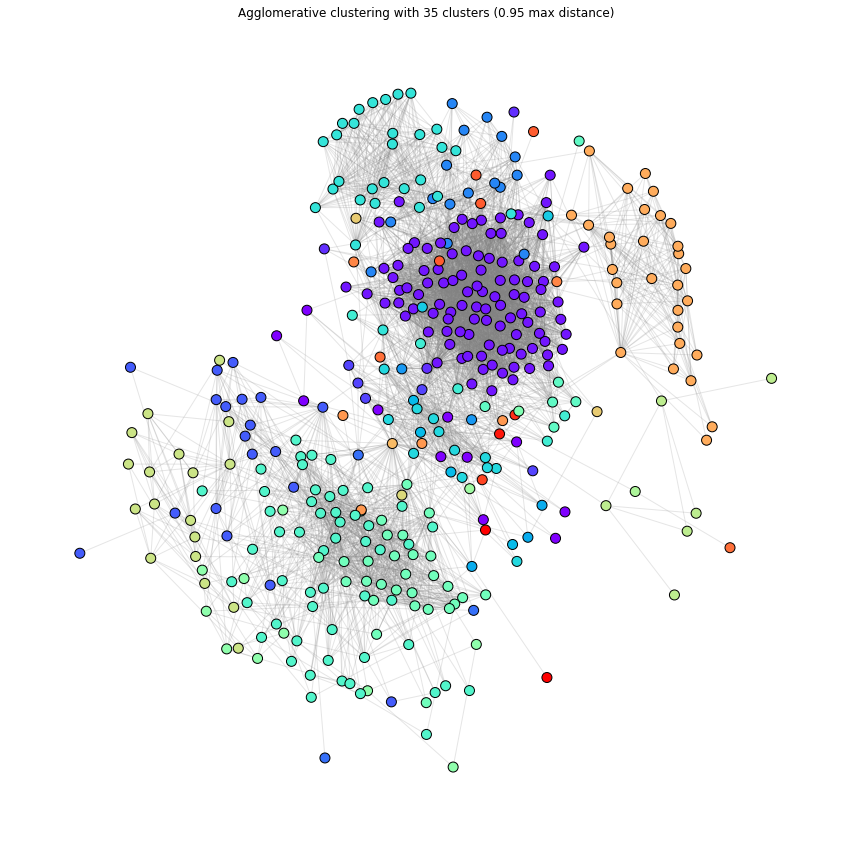

In [ ]:
labels = agglomerative_clustering(distance, 0.95)
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(
    G, 
    lespos,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=100, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(
    G,
    lespos,
    alpha=0.2,
    edge_color='grey'
)
plt.axis('off')
plt.title('Agglomerative clustering with 35 clusters (0.95 max distance)')
plt.show()

In [ ]:
len(pd.Series(labels).unique()) # there are 8 clusters

8

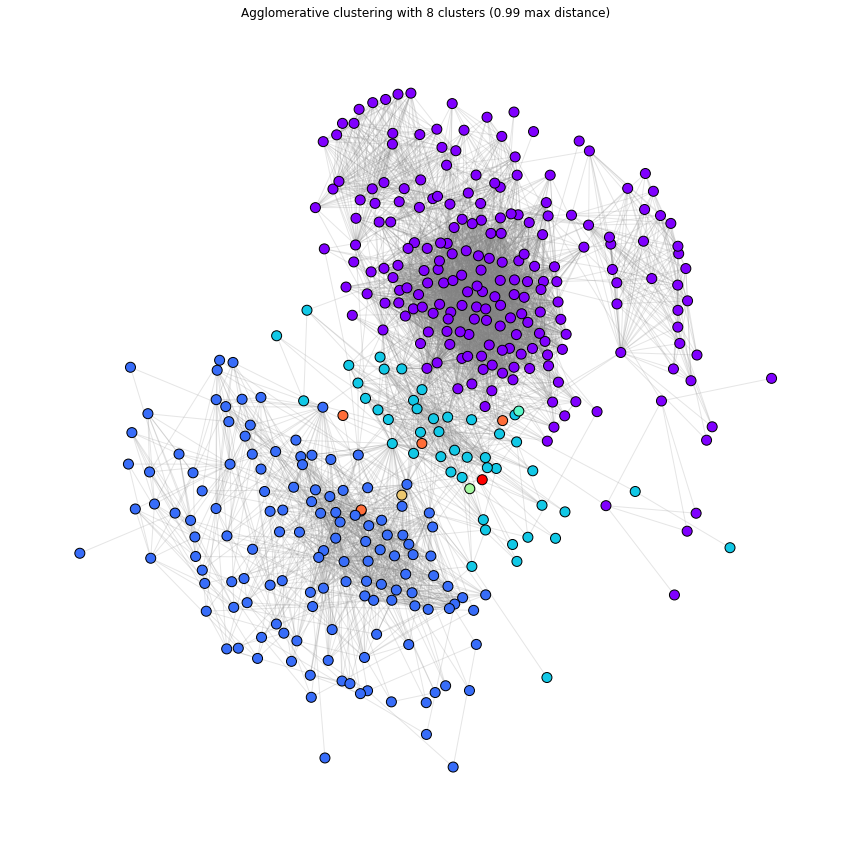

In [ ]:
labels = agglomerative_clustering(distance, 0.99)
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(
    G, 
    lespos,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=100, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(
    G,
    lespos,
    alpha=0.2,
    edge_color='grey'
)
plt.axis('off')
plt.title('Agglomerative clustering with 8 clusters (0.99 max distance)')
plt.show()

Agglomerative clustering is very sensitive to choice of max distance (0.99 - 387 clusters, 0.95 - 8 clusters), therefore this algorithm works worser than spectral clustering.

### Label propogation

In [ ]:
def sync_update_labels(graph, labels):
  arr = []
  for node in graph.nodes:
      neighbors = list(graph.neighbors(node))
      if len(neighbors) == len(set(neighbors)):
        new_label = np.random.choice(neighbors)
        ind = list(graph.nodes).index(new_label)
        arr.append(labels[ind])
      else:
        new_label = Counter(arr).most_common()[0][0]
        ind = list(graph.nodes).index(new_label)
        arr.append(labels[ind])
  return np.array(arr)


def async_update_labels(graph, labels):

  arr = []
  for _ in range(len(graph.nodes)):
    node = np.random.choice(graph.nodes)
    neighbors = list(graph.neighbors(node))
    if len(neighbors) == len(set(neighbors)):
      new_label = np.random.choice(neighbors)
      ind = list(graph.nodes).index(new_label)
      arr.append(labels[ind])
    else:
      new_label = Counter(arr).most_common()[0][0]
      ind = list(graph.nodes).index(new_label)
      arr.append(labels[ind])
      
  return np.array(arr)

In [ ]:
  def plot_propagation(G, update_method, n=50):
    pos=nx.kamada_kawai_layout(G)
    labels = np.array(list(G.nodes))
    for i in range(n):
        clear_output(wait=True)
        labels = update_method(G, labels)
        plt.figure(figsize=(15, 15))
        nx.draw_networkx_nodes(
            G, 
            pos=pos, 
            node_color=labels, 
            cmap=plt.cm.rainbow,
            node_size=100, 
            edgecolors='grey'
        )
        nx.draw_networkx_edges(G, pos=pos, alpha=0.2)
        plt.axis('off')
        plt.title('Iteration {}/{}'.format(i+1, n))
        plt.show()

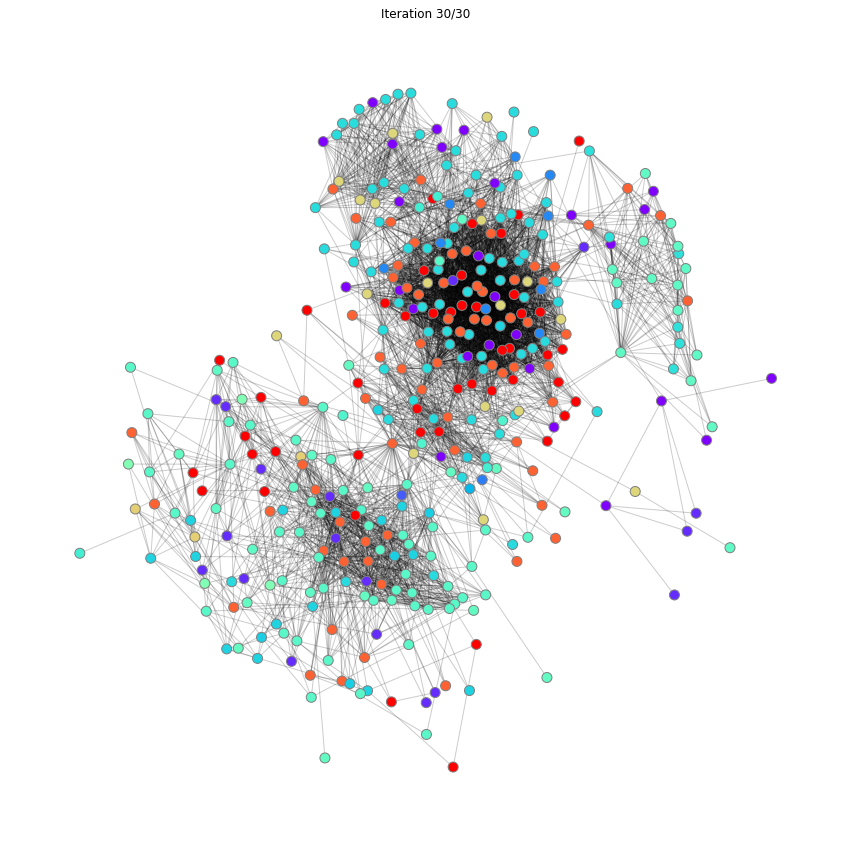

In [ ]:
plot_propagation(G, sync_update_labels, 30)

In [ ]:
labels = np.array(list(G.nodes)) # initial partition
new_labels = async_update_labels(G, labels)

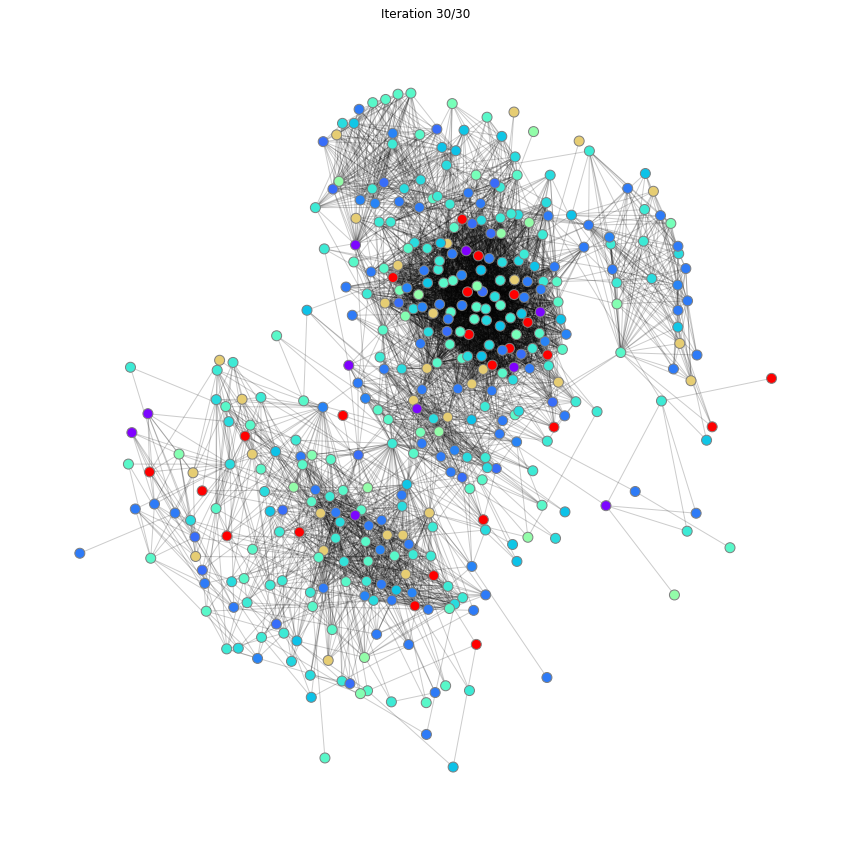

In [ ]:
plot_propagation(G, async_update_labels, 30)

## Conclusions

Degree distribution is not Power Law (it has a shape of PWI because most of social networks are scaled free) because less nodes in graph should have greater degree. Scale-free networks have no much nodes with high degree.

VK graph has degree distribution like BA model, large diameter like BA and WS model, large avg clustering coefficient like WS.

Agglomerative clustering algo has worse performance since its sensitivity to the choice of max distance. Spectral clustering shows better results. However, both algorithms do not distinguished users from different groups of interests (school friends, university friends, students from 3 teaching assistant groups). One suggestion here appears to reach better performance might be useful to set number of clusters equaled to number of cc.